# Fine-tuning DETR for balloon object detection

### Danil Tokhchukov

In [ ]:
%%capture

! pip install torchmetrics[detection]
! pip install albumentations

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("vbookshelf/v2-balloon-detection-dataset")

print("Path to dataset files:", path)

In [ ]:
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import json

%matplotlib inline

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import cv2
from torchvision.datasets import CocoDetection
from pycocotools.coco import COCO
import albumentations as A
import wandb
from tqdm import tqdm

device = "cuda:1" if torch.cuda.is_available() else "cpu"

/home/tohchukovda/.conda/envs/rockstar/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
batch_size = 8
dl_shuffle = True

DATA_PATH = Path(path)

In [6]:
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [7]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, x_max, y_max = bbox
    x_min, y_min, x_max, y_max = round(x_min), round(y_min), round(x_max), round(y_max)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    return img


def visualize(image, target):
    img = image.copy()
    bboxes = [annotation["bbox"] for annotation in target["annotations"]]
    bboxes = [(bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]) for bbox in bboxes]
    for bbox in bboxes:
        img = visualize_bbox(img, bbox)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

# Data

### Datasets

In [8]:
from sklearn.model_selection import train_test_split

annotations_df = pd.read_csv(DATA_PATH / "balloon-data.csv")
train_df, test_val_df = train_test_split(annotations_df, test_size=0.3)
test_df, val_df = train_test_split(test_val_df, test_size=0.5)

In [9]:
import json

def Generate_COCO_Annotations(dataframe, output_file):
    coco_format = {
        "images": [],
        "annotations": [],
        "categories": [{"id": 0, "name": "balloon"}]
    }
    
    annotation_counter = 1
    for index, record in dataframe.iterrows():
        filename = record['fname']
        image_id = index
        img_width, img_height = record['width'], record['height']

        coco_format["images"].append({
            "id": image_id,
            "file_name": filename,
            "width": img_width,
            "height": img_height
        })

        bounding_boxes = eval(record['bbox'])
        for box in bounding_boxes:
            x_min, y_min, x_max, y_max = box['xmin'], box['ymin'], box['xmax'], box['ymax']
            box_width = x_max - x_min
            box_height = y_max - y_min
            area = box_width * box_height
            
            coco_format["annotations"].append({
                "id": annotation_counter,
                "image_id": image_id,
                "category_id": 0,
                "bbox": [x_min, y_min, box_width, box_height],
                "area": area,
                "iscrowd": 0
            })
            annotation_counter += 1

    with open(output_file, 'w') as json_file:
        json.dump(coco_format, json_file)


In [10]:
Generate_COCO_Annotations(train_df, "train_annotations.json")
Generate_COCO_Annotations(val_df, "val_annotations.json")
Generate_COCO_Annotations(test_df, "test_annotations.json")

In [ ]:
class BaloonsDataset(CocoDetection):
    def __init__(self, imgs_folder, ann_file, transform=None):
        super().__init__(imgs_folder, ann_file)
        self.transform = transform
        self.coco = COCO(ann_file)
        self.imgs_folder = Path(imgs_folder)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        annotations = self.coco.loadAnns(ann_ids)
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info["file_name"]

        image = Image.open(self.imgs_folder / path).convert("RGB")
        image = np.array(image)

        if self.transform:
            bboxes = []
            class_labels = []
            for ann in annotations:
                bbox = ann["bbox"]
                xmin, ymin, width, height = bbox
                xmax = xmin + width
                ymax = ymin + height
                bboxes.append([xmin, ymin, xmax, ymax])
                class_labels.append(ann["category_id"])
            transformed = self.transform(
                image=image, bboxes=bboxes, class_labels=class_labels
            )
            image = transformed["image"]
            bboxes = transformed["bboxes"]
            class_labels = transformed["class_labels"]

            annotations = []
            for bbox, label in zip(bboxes, class_labels):
                xmin, ymin, xmax, ymax = bbox
                width = xmax - xmin
                height = ymax - ymin
                annotations.append({
                    "bbox": [xmin, ymin, width, height],
                    "category_id": label,
                    "iscrowd": 0,
                    "area": width * height
                })

        target = {"image_id": img_id, "annotations": annotations}

        return image, target

In [12]:
transform = A.Compose([
    A.Resize(800, 800)
], bbox_params=A.BboxParams(format="pascal_voc", label_fields=["class_labels"]))

In [13]:
train_dataset = BaloonsDataset(DATA_PATH / "images", "train_annotations.json", transform=transform)
val_dataset = BaloonsDataset(DATA_PATH / "images", "val_annotations.json", transform=transform)
test_dataset = BaloonsDataset(DATA_PATH / "images", "test_annotations.json")

len(train_dataset), len(val_dataset), len(test_dataset)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


(51, 12, 11)

### Dataloaders

In [15]:
from transformers import DetrImageProcessor

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

2024-12-24 15:50:39.087946: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-24 15:50:39.104949: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1735055439.124661 2111268 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1735055439.130832 2111268 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-24 15:50:39.151772: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [16]:
def collate_fn(batch):
    images = [item[0] for item in batch]
    annotations = [item[1] for item in batch]

    encoding = processor(images=images, annotations=annotations, return_tensors="pt", do_pad=True)
    pixel_values = encoding["pixel_values"]
    pixel_mask = encoding["pixel_mask"]
    labels = encoding["labels"]

    return {
        'pixel_values': pixel_values,
        'pixel_mask': pixel_mask,
        'labels': labels
    }


In [17]:
train_dl = DataLoader(train_dataset, shuffle=dl_shuffle, collate_fn=collate_fn, batch_size=batch_size)
val_dl = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=batch_size)
test_dl = DataLoader(test_dataset, collate_fn=collate_fn, batch_size=batch_size)

In [18]:
next(iter(train_dl)).keys()

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


dict_keys(['pixel_values', 'pixel_mask', 'labels'])

### Data visualization

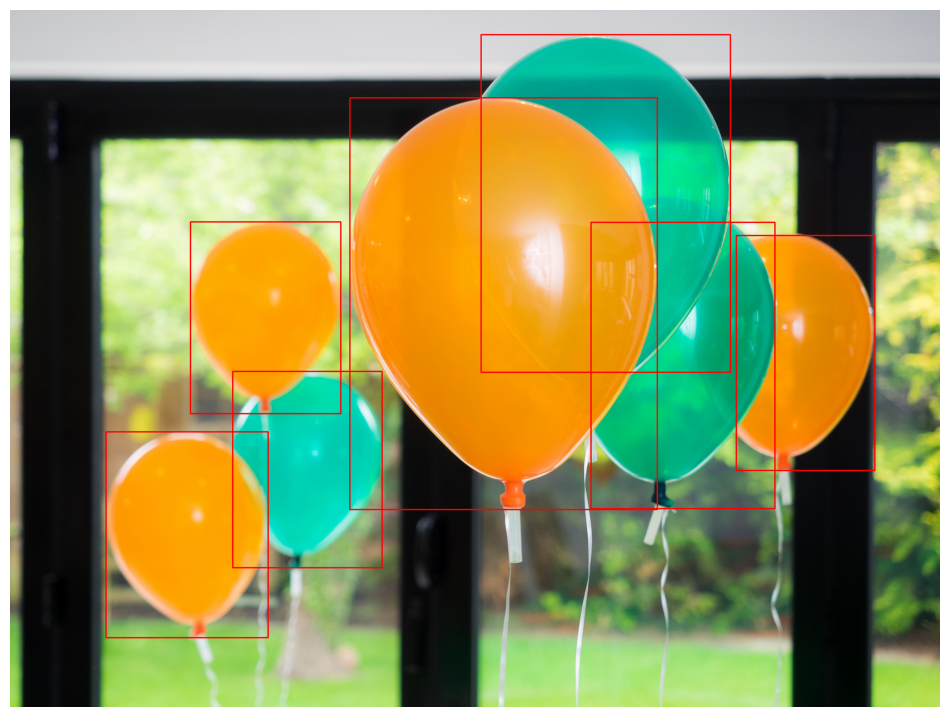

In [19]:
img, target = test_dataset[0]
visualize(img, target)

# Augmentations

In [20]:
transform1 = A.Compose([
    A.HorizontalFlip(p=1.0),
    A.Resize(800, 800)
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

transform2 = A.Compose([
    A.RandomBrightnessContrast(p=1.0),
    A.Resize(800, 800)
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

transform3 = A.Compose([
    A.CoarseDropout(p=1.0, hole_height_range=(5, 15), hole_width_range=(5, 15), num_holes_range=(100, 1000)),
    A.Resize(800, 800)
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

In [21]:
train_dataset_hf = BaloonsDataset(DATA_PATH / "images", "train_annotations.json", transform=transform1)
train_dataset_rbc = BaloonsDataset(DATA_PATH / "images", "train_annotations.json", transform=transform2)
train_dataset_cd = BaloonsDataset(DATA_PATH / "images", "train_annotations.json", transform=transform3)

len(train_dataset_hf), len(train_dataset_rbc), len(train_dataset_cd)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


(51, 51, 51)

In [22]:
train_dataset_augmented = torch.utils.data.ConcatDataset([train_dataset, train_dataset_hf, train_dataset_rbc, train_dataset_cd])
len(train_dataset_augmented)

204

In [23]:
train_dl_aug = DataLoader(train_dataset_augmented, shuffle=dl_shuffle, collate_fn=collate_fn, batch_size=batch_size)

## Augmentations visualization

In [24]:
img_idx = 0

### Horizontal Flip

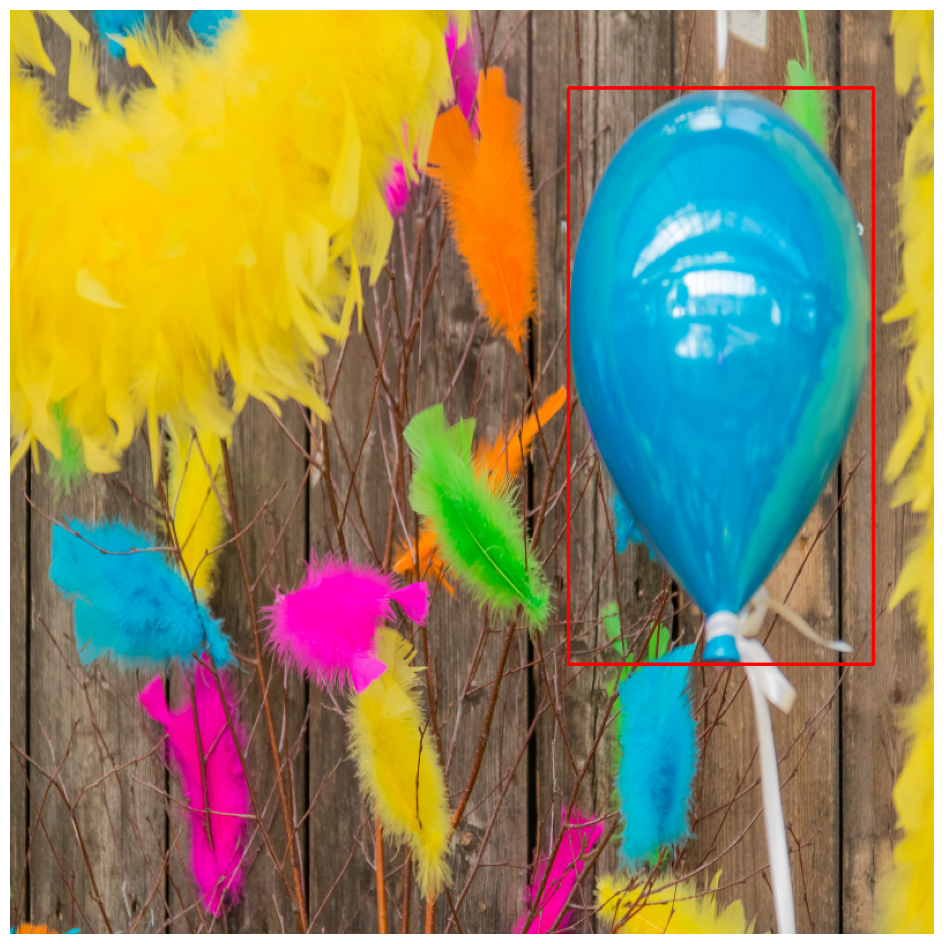

In [25]:
img, target = train_dataset_hf[img_idx]
visualize(img, target)

### Random Brightness Contrast

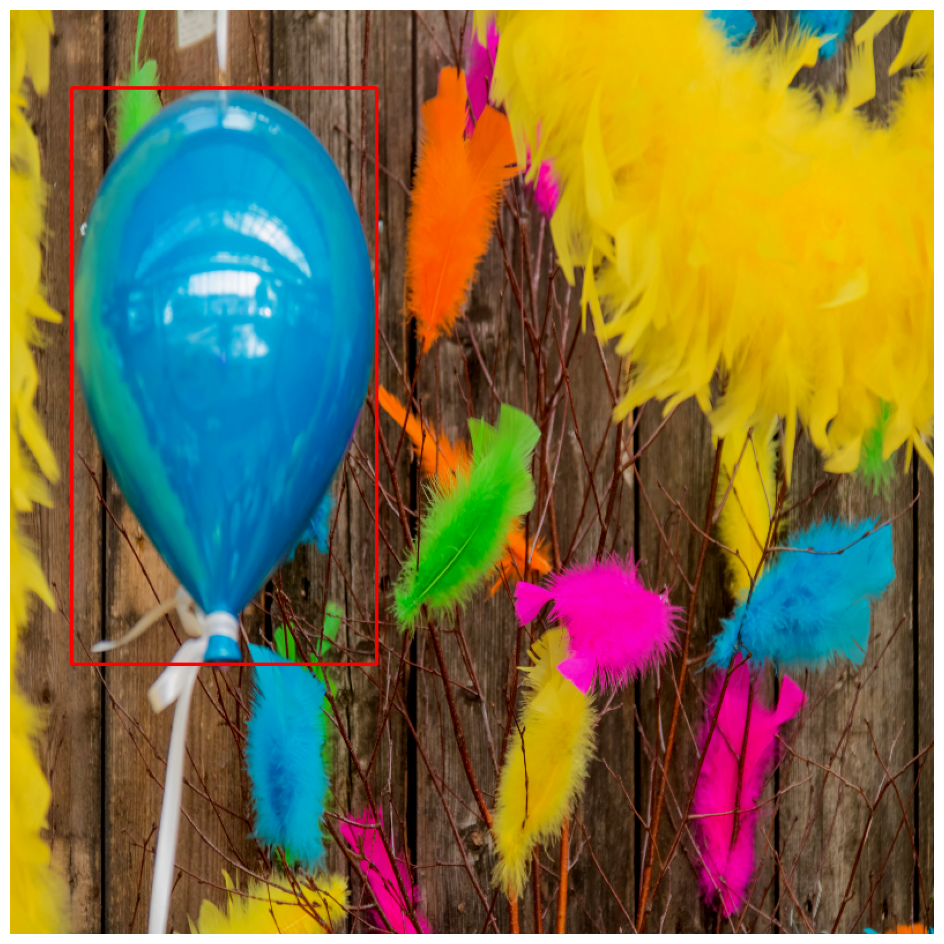

In [26]:
img, target = train_dataset_rbc[img_idx]
visualize(img, target)

### Droupout

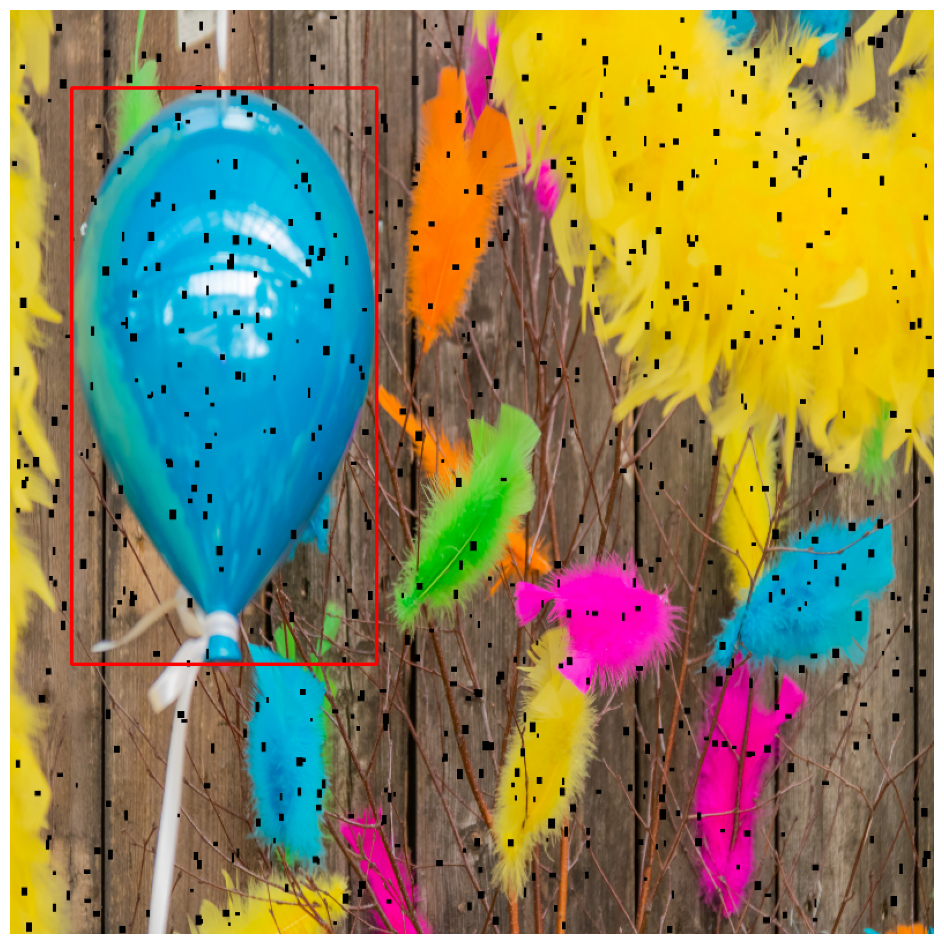

In [27]:
img, target = train_dataset_cd[img_idx]
visualize(img, target)

# Model Fine-tuning

## Train

In [28]:
from transformers import DetrForObjectDetection

model = DetrForObjectDetection.from_pretrained(
            "facebook/detr-resnet-50",
            revision="no_timm",
            num_labels=1,
            ignore_mismatched_sizes=True
        )
model.config.id2label = {0: 'balloon'}
model.config.label2id = {'balloon': 0}

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [29]:
model = model.to(device)

In [31]:
! wandb login

/bin/bash: /opt/miniconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
wandb: Currently logged in as: danilkes (makriot). Use `wandb login --relogin` to force relogin


In [32]:
wandb.init(
    # set the wandb project where this run will be logged
    project="detr",
    name="with augmentation",

    # track hyperparameters and run metadata
    config={
    "learning_rate": 0.0001,
    "scheduler_step": 5,
    "architecture": "DETR",
    "dataset": "Baloons",
    "epochs": 101,
    }
)


wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: danilkes (makriot). Use `wandb login --relogin` to force relogin


In [33]:
def validate(model, val_dataloader, device):
    model.eval()
    running_loss = 0.0
    for batch in val_dataloader:
        pixel_values = batch["pixel_values"].to(device)
        pixel_mask = batch["pixel_mask"].to(device)
        labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]
        
        model_output = model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)
        loss = model_output["loss"]
        running_loss += loss.item()

    torch.cuda.empty_cache()
    return running_loss / len(val_dataloader)

In [ ]:
def train(model, num_epoch, train_dataloader, val_dataloader, optimizer, scheduler, device):
    model.train()
    for epoch in range(num_epoch):
        for batch in train_dataloader:
            optimizer.zero_grad()

            pixel_values = batch["pixel_values"].to(device)
            pixel_mask = batch["pixel_mask"].to(device)
            labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]
            
            model_output = model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)
            loss = model_output["loss"]
            
            loss.backward()
            optimizer.step()
        scheduler.step()
        torch.cuda.empty_cache()
        print(f"Epoch: {epoch}, Training loss: {float(loss.item())}")
        wandb.log({"Training loss": float(loss.item())})
        val_loss = validate(model, val_dataloader, device)
        print(f"Epoch: {epoch}, Validation loss: {val_loss}")
        wandb.log({"Validation loss": val_loss})
        model.train()

In [ ]:
from torch.optim.lr_scheduler import StepLR, ExponentialLR

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = StepLR(optimizer, step_size=10, gamma=0.5)
# scheduler = ExponentialLR(optimizer, gamma=0.9)

In [ ]:
# num_epoches = 101

# train(model, num_epoches, train_dl, val_dl, optimizer, scheduler, device)

In [ ]:
num_epoches = 101

train(model, num_epoches, train_dl_aug, val_dl, optimizer, scheduler, device)

Wandb logs: [https://api.wandb.ai/links/makriot/log1twmf](https://api.wandb.ai/links/makriot/log1twmf)

---

# Evaluate mAP

In [ ]:
! pip install -q coco-eval

In [40]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

### Without augmentations

In [65]:
from coco_eval import CocoEvaluator

evaluator = CocoEvaluator(coco_gt=test_dataset.coco, iou_types=["bbox"])

print("Running evaluation...")
for idx, batch in enumerate(tqdm(test_dl)):
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes, threshold=0)
    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

Running evaluation...


100%|██████████| 2/2 [00:01<00:00,  1.25it/s]

Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.701
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.940
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.872
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.755
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.204
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.687
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.816
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.756
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= 

### With augmentations

In [41]:
from coco_eval import CocoEvaluator

evaluator = CocoEvaluator(coco_gt=test_dataset.coco, iou_types=["bbox"])

print("Running evaluation...")
for idx, batch in enumerate(tqdm(test_dl)):
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes, threshold=0)
    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

Running evaluation...


100%|██████████| 2/2 [00:01<00:00,  1.25it/s]

Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.715
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.957
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.856
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.597
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.779
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.204
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.700
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.787
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.694
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= 

# Visualization

In [44]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, scores, labels, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for score, label, (xmin, ymin, xmax, ymax),c  in zip(scores.tolist(), labels.tolist(), boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        text = f'{model.config.id2label[label]}: {score:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [ ]:
def visualize_prediction(idx):
    img, target = test_dataset[idx]
    encoding = processor(images=img, annotations=target, return_tensors="pt")
    pixel_values = encoding["pixel_values"].squeeze(0).to(device)
    pixel_mask = encoding["pixel_mask"].squeeze(0)
    labels = encoding["labels"][0]

    pixel_values = pixel_values.unsqueeze(0)

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values, pixel_mask=None)

    image_id = labels['image_id'].item()
    image = test_dataset.coco.loadImgs(image_id)[0]
    image = Image.open(DATA_PATH / 'images' / image['file_name'])

    width, height = image.size
    postprocessed_outputs = processor.post_process_object_detection(outputs,
                                                                    target_sizes=[(height, width)],
                                                                    threshold=0.9)
    results = postprocessed_outputs[0]
    plot_results(image, results['scores'], results['labels'], results['boxes'])

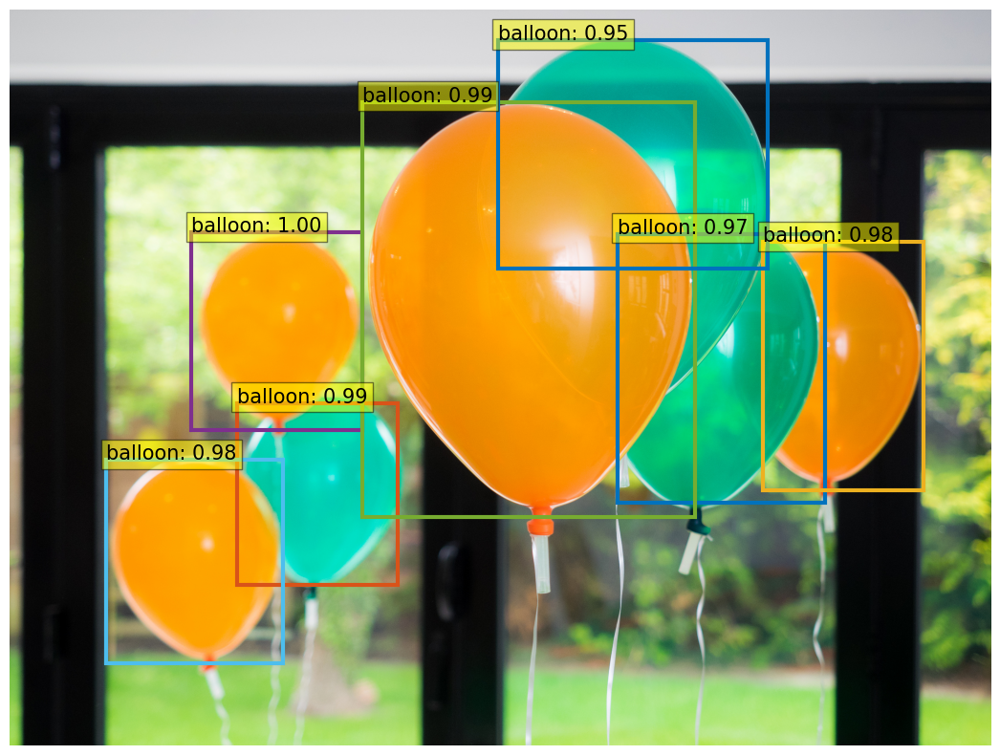

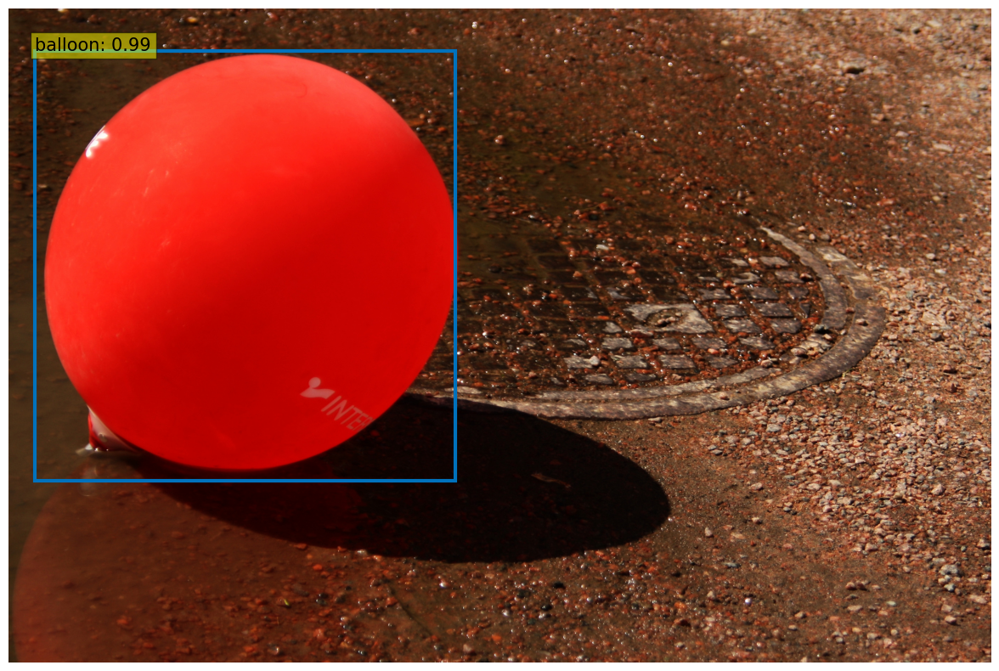

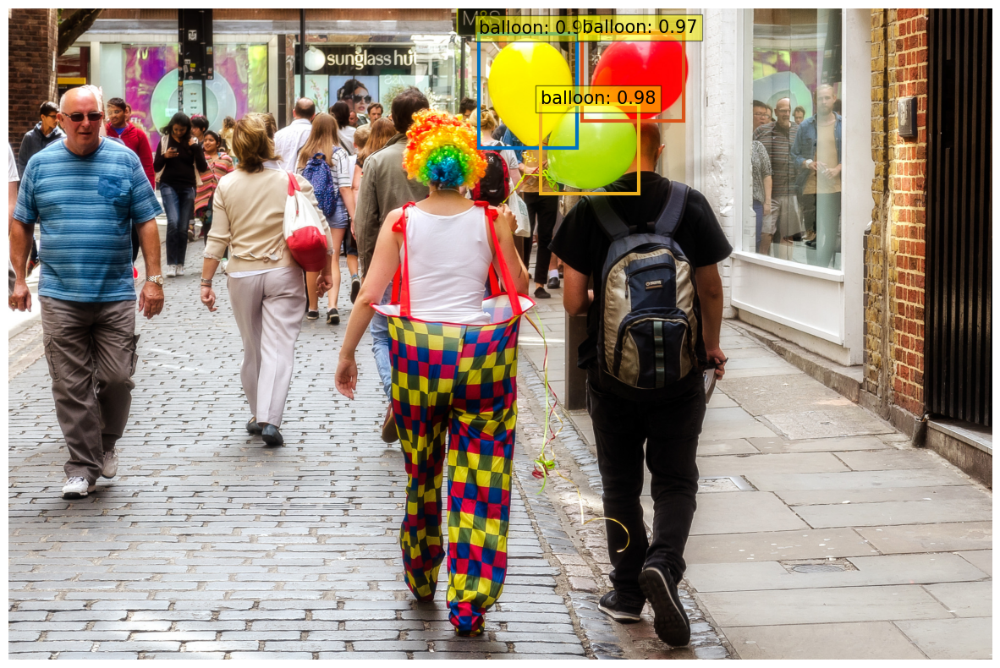

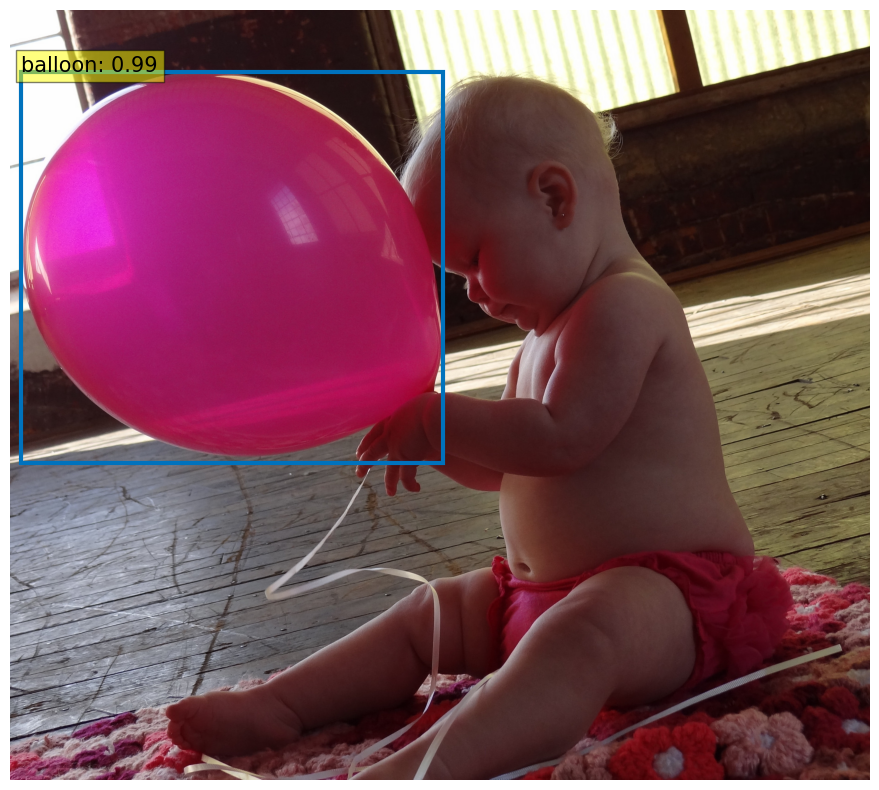

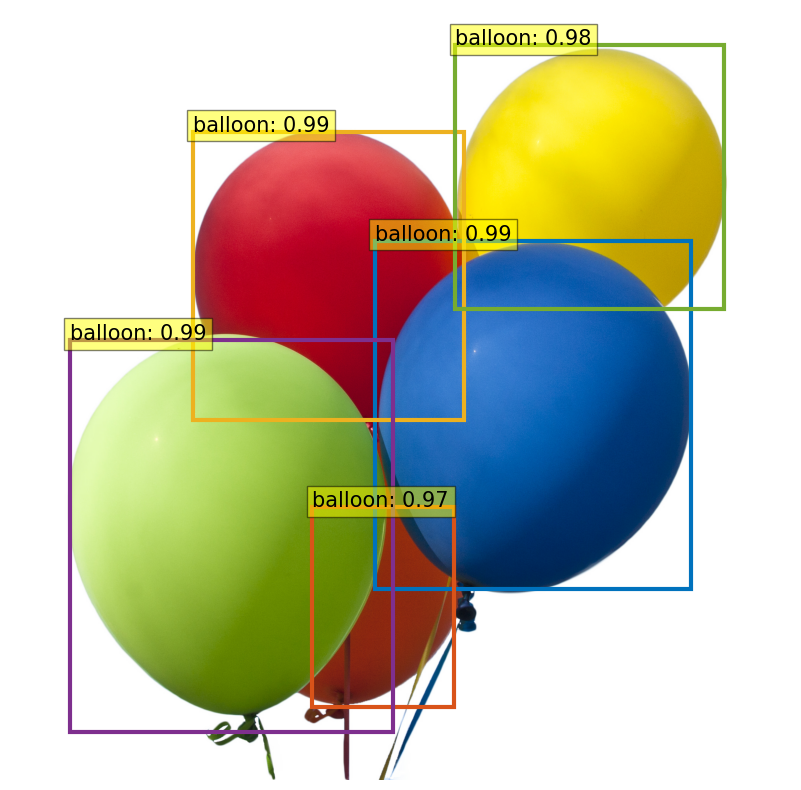

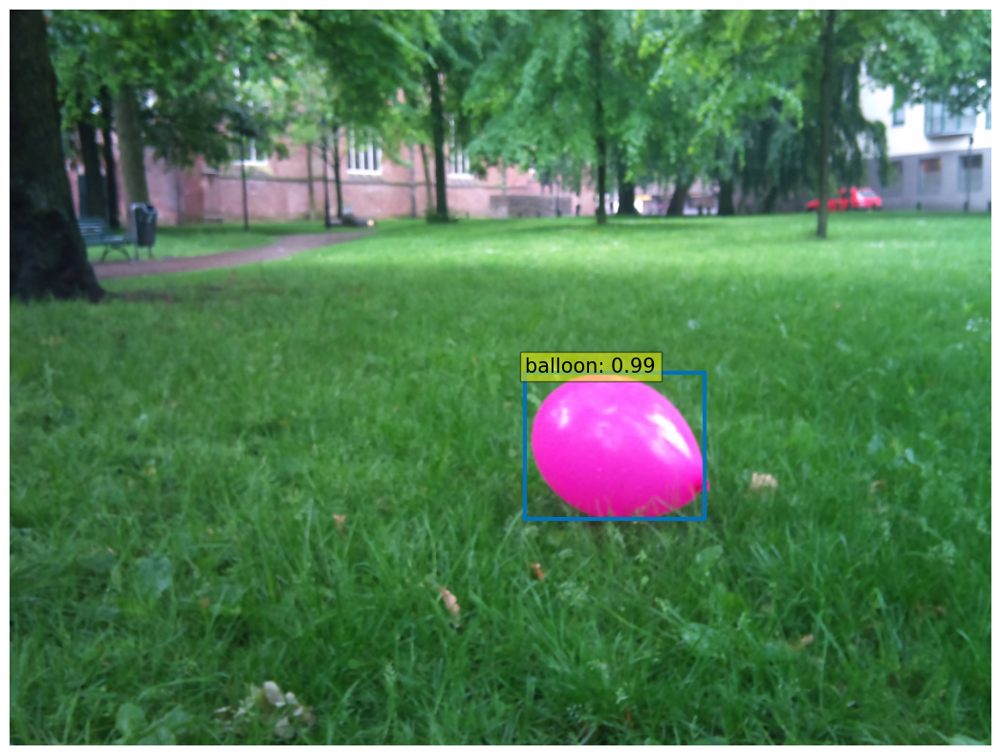

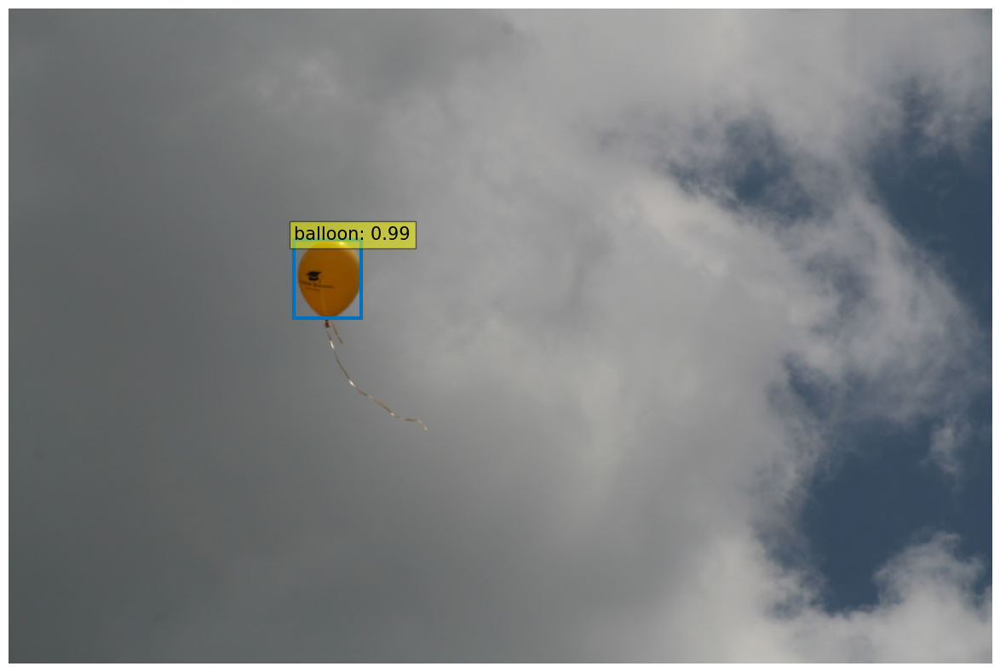

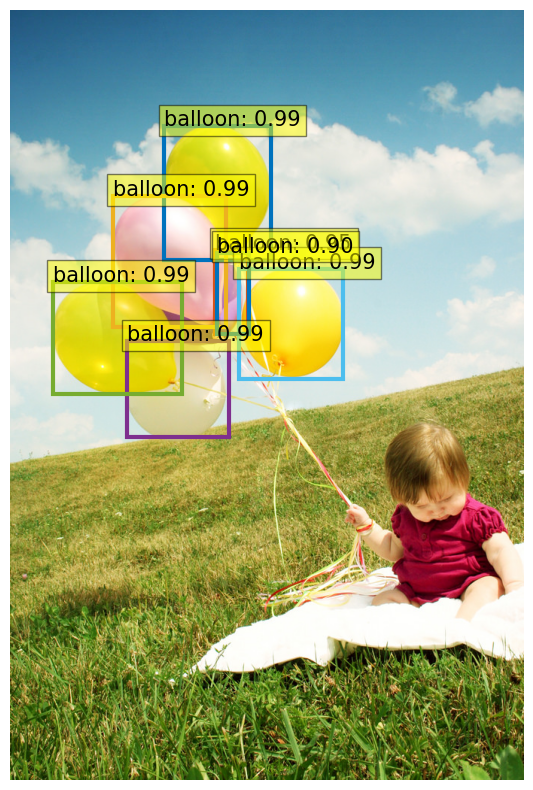

In [81]:
for idx in [0, 1, 2, 3, 4, 5, 6, 10]:
    visualize_prediction(idx)